<img src="https://www.mmu.edu.my/fci/wp-content/uploads/2021/01/FCI_wNEW_MMU_LOGO.png" style="height: 80px;" align=left>  

# Learning Objectives

Towards the end of this lesson, you should be able to:
- perform classification and regression using decision tree
- implement ensemble models for classification




---



### For Google Colab Use Only
Skip this section if you are using Jupyter Notebook etc.

In [1]:
# from google.colab import drive
# drive.mount('/content/drive')

In [2]:
drive_path = 'C:/Users/user/Downloads/projects/Data Science (Revision Gallery)/Data Mining/lab/Tutorial 8/' #set your google drive path

---

# Decision Tree
[Decision Trees (DTs)](https://scikit-learn.org/stable/modules/tree.html) are a non-parametric supervised learning method used for classification and regression. The goal is to create a model that predicts the value of a target variable by learning simple decision rules inferred from the data features. Essentially, the training of the decision tree is a process that recursively selects the best feature to split the data samples until a decision is made.

Some advantages of DTs include:
* decisions can be easily intepreted and visualized
* can handle both numerical and categorical data

Some of the disadvantages include:
* can create over-complex trees that do not generalize the data well (overfit)
* can be biased due to data imbalance

Let's try out the simple classifier on the `diabetes.csv` dataset.


In [3]:
#import the relevant libraries
import pandas as pd #data reading
import matplotlib.pyplot as plt
from sklearn import preprocessing # label encoding
from sklearn.tree import DecisionTreeClassifier, plot_tree # Import Decision Tree Classifier and plotting function
from sklearn.model_selection import train_test_split # Import train_test_split function

#code to ensure path
try:
  drive_path
except NameError:
  drive_path = ''

# load diabetes.csv dataset
df = pd.read_csv(drive_path + "diabetes.csv")
df.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


The python implementation of DTs by scikit-learn requires the input attributes to be numerical representation (even though the numbers represent categories), while the output class labels to be categorical. The `diabetes.csv` dataset contains fully numerical data. Therefore, we need to convert the target class attribute, which is `Outcome` into categorical/string type.<br>
*Note*: Data (numerical attributes) normalization is not necessary for DT training because the attribute selection measures are not influenced by the unit of measures.

In [4]:
# check the data types
df.dtypes

Pregnancies                   int64
Glucose                       int64
BloodPressure                 int64
SkinThickness                 int64
Insulin                       int64
BMI                         float64
DiabetesPedigreeFunction    float64
Age                           int64
Outcome                       int64
dtype: object

In [5]:
# the class variable must be categorical data. Take note of the change in data type for Outcome
df.Outcome = df['Outcome'].astype('category')
df.dtypes

Pregnancies                    int64
Glucose                        int64
BloodPressure                  int64
SkinThickness                  int64
Insulin                        int64
BMI                          float64
DiabetesPedigreeFunction     float64
Age                            int64
Outcome                     category
dtype: object

Then, we can split the dataset attributes and class labels into their own variables, and then create the training, validation, and testing sets. <br>
*Note*: The `train_test_split` function does not provide a direct train/val/test split, so we can split the dataset twice to create the 3 sets.

In [6]:
#split dataset in features and target variable*
# feature_cols = ['Pregnancies', 'Insulin', 'BMI', 'Age','Glucose','BloodPressure','DiabetesPedigreeFunction']
X = df.select_dtypes(['float64','int64']) #Features
y = df.Outcome # Target variable
print(X.shape)
print(y.shape)

(768, 8)
(768,)


In [7]:
#First split to get 20% as test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)

#Split the training set again to get the validation set (requires calculation the get the needed percentage)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.125, random_state=1)
# 12.5% of 80% is 10% of the whole dataset (0.125 x 0.8 = 0.1)

print('Training set: ', y_train.shape)
print('Validation set: ', y_val.shape)
print('Testing set: ', y_test.shape)


Training set:  (537,)
Validation set:  (77,)
Testing set:  (154,)


With the ready datasets, we can create and train a DT model

In [8]:
# Create Decision Tree classifer object and list all the default parameters

clf = DecisionTreeClassifier()
clf.get_params()

{'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': None,
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'random_state': None,
 'splitter': 'best'}

By default, the classifier is set to use the Gini metric as the criteria for attribute selection. You can use the `entropy` or `log_loss` criteria by setting the `criterion` parameter.

Let's just train the default model and visualize the decision tree.

In [9]:
# Train Decision Tree Classifer using default parameters
clf = clf.fit(X_train,y_train)

#Predict the response for test dataset
y_val_pred = clf.predict(X_val)
print(y_val_pred)

[0 0 0 0 0 0 0 0 1 0 0 0 0 1 1 1 0 0 0 1 0 0 1 1 1 0 0 1 1 0 0 0 0 0 1 0 0
 0 1 1 0 1 1 0 1 1 0 1 0 1 0 0 0 0 1 0 0 1 1 0 0 1 0 1 0 1 1 0 1 0 0 0 1 1
 1 0 0]


In [10]:
#Visualize the trained Decision Tree
fn=X.columns
cn=['0','1']
fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (30,30), dpi=600)
plot_tree(clf,
          feature_names = fn,
          class_names=cn,
          filled = True, fontsize=2);


In [11]:
#save the visualization for easier inspection
fig.savefig(drive_path+'DT_model.png')

**NOTE:** the ``value`` represents the value for class 0 and 1, respectively

In the decision tree chart, each internal node has a decision rule that splits the data. Gini referred as Gini ratio, which measures the impurity of the node. You can say a node is pure when all of its records belong to the same class, such nodes known as the leaf node. If your decision tree nodes are overlapping, adjust parameters in `subplots` (long processing time if `figsize` is set larger).

As you can see, by default the resultant tree is very large with a lot of branches (unpruned). This unpruned tree can be tedious to understand and may overfit the training data. Let's optimize the model by training a pruned version, by limiting the tree depth:

In [12]:
# Create Decision Tree classifer object
clf_pruned = DecisionTreeClassifier(max_depth=5) #pruning the tree by setting the depth

# Train Decision Tree Classifer*
clf_pruned = clf_pruned.fit(X_train,y_train)

#Predict the response for test dataset*
y_val_pred_pruned = clf_pruned.predict(X_val)
print(y_val_pred_pruned)

[0 0 0 0 0 0 0 0 1 0 0 0 0 1 1 0 0 0 0 1 0 1 1 0 0 0 0 1 1 0 0 0 0 0 0 0 0
 0 1 0 0 1 1 0 0 1 1 0 0 1 0 1 0 0 0 0 0 1 1 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0
 1 1 0]


In [13]:
fn=X.columns
cn=['0','1']
fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (30,30), dpi=600)
plot_tree(clf_pruned,
          feature_names = fn,
          class_names=cn,
          filled = True, fontsize=2);

In [14]:
#save the visualization for easier inspection
fig.savefig(drive_path+'DT_pruned.png')

### Exercise

train another DT using `entropy` and then compare the performance with the previous two models by evaluating them on the validation set using the accuracy (`score`) and confusion matrix (`confusion_matrix`). Which model is better?

In [15]:
#Enter your codes here

clf_entropy = DecisionTreeClassifier(criterion='entropy', max_depth=5)
clf_entropy.get_params()


{'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'entropy',
 'max_depth': 5,
 'max_features': None,
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'random_state': None,
 'splitter': 'best'}

In [16]:
# Train Decision Tree Classifer using default parameters
clf_entropy= clf_entropy.fit(X_train,y_train)
#Predict the response for test dataset
y_val_pred = clf_entropy.predict(X_val)
print(y_val_pred)

[1 0 0 0 0 0 0 0 1 0 0 0 0 1 1 0 0 1 0 1 1 0 1 0 0 0 0 0 1 0 0 1 0 0 0 0 0
 0 1 0 0 1 0 0 0 0 0 0 0 1 0 1 0 1 0 1 1 1 1 1 0 0 1 0 0 1 1 0 0 1 0 0 0 0
 1 0 0]


In [17]:
#Visualize the trained Decision Tree
fn=X.columns
cn=['0','1']
fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (30,30), dpi=600)
plot_tree(clf_entropy,
          feature_names = fn,
          class_names=cn,
          filled = True, fontsize=2);

Accuracy Score: 0.7402597402597403
Confusion Matrix:
[[41  9]
 [11 16]]


<AxesSubplot: >

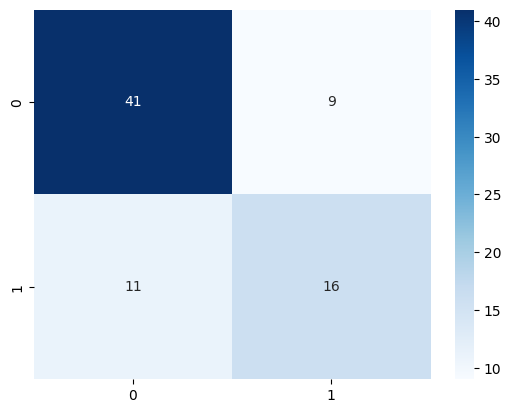

In [18]:
from sklearn.metrics import accuracy_score, confusion_matrix
import seaborn as sns

# Calculate accuracy
accuracy = accuracy_score(y_val, y_val_pred)
print("Accuracy Score:", accuracy)

# Generate confusion matrix
cm = confusion_matrix(y_val, y_val_pred)
print("Confusion Matrix:")
print(cm)
sns.heatmap(cm, cmap="Blues", annot=True)

---

## Side Track: Decision Tree Regression

Scikit-learn provides the version of Decision Trees that can be used for the regression task (predict numerical outputs), namely [Decision Tree Regressor](https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeRegressor.html) (Regression Tree).

The usage is similar to the DT classifier, just ensure the dataset is appropriately preprocessed. For the example we will use the small `petrol_consumption.csv` dataset containing numerical attributes and target output to try out the model.

*Note*: similar to classification, the dataset should be split into sets for the regression task  (supervised learning).

In [19]:
from sklearn.tree import DecisionTreeRegressor #import regression tree

pc_df = pd.read_csv(drive_path+'petrol_consumption.csv')
pc_df.head()

,Petrol_tax,Average_income,Paved_Highways,Population_Driver_licence(%),Petrol_Consumption
0,9.0,3571,1976,0.525,541
1,9.0,4092,1250,0.572,524
2,9.0,3865,1586,0.580,561
3,7.5,4870,2351,0.529,414
4,8.0,4399,431,0.544,410


In [20]:
#split dataset into attributes (X) and target output (y)
X_pc = pc_df.drop('Petrol_Consumption',axis=1)
y_pc = pc_df['Petrol_Consumption']
print(X.shape)
print(y.shape)

(768, 8)
(768,)


In [21]:
# split by 70-30, random_state=2

from sklearn.model_selection import train_test_split
X_tr, X_ts, y_tr, y_ts = train_test_split(X_pc, y_pc, test_size=0.3, random_state=2)

In [22]:
# create model using default hyperparameters

# regressor = DecisionTreeRegressor(max_depth=10)
regressor = DecisionTreeRegressor(max_depth=3)
regressor.fit(X_tr, y_tr)

DecisionTreeRegressor(max_depth=3)

In [23]:
#Perform prediction and observe the outputs
y_pred = regressor.predict(X_ts)
df=pd.DataFrame({'Actual':y_ts, 'Predicted':y_pred})
display(df)

,Actual,Predicted
23,547,562.625000
12,525,446.100000
42,632,641.571429
16,603,641.571429
35,644,641.571429
43,591,641.571429
46,610,641.571429
13,508,641.571429
14,566,641.571429
0,541,562.625000


For regression models, there are 3 common metrics:
* Mean Absolute Error: $MAE = \frac{1}{n} \sum^{n}_{i=1} |y_i-\hat{y}_i|$
* Mean Squared Error: $MSE = \frac{1}{n} \sum^{n}_{i=1} (y_i-\hat{y}_i)^2$
* R-squared (coefficient of determination): $S^2 = \frac{SS_{res}}{SS_{tot}} = 1 - \frac{\sum_i (y_i - \hat{y}_i)^2}{\sum_i (y_i - \bar{y})^2}$

where $y_i$ is the actual output, $\hat{y}_i$ is the predicted output, $SS_{res}$ is the Residual Sum of Squares, and $SS_{tot}$ is the Total Sum of Squares.

Let's try them:

In [24]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

mae = mean_absolute_error(y_ts,y_pred)
mse = mean_squared_error(y_ts,y_pred)
r2 = r2_score(y_ts, y_pred)

print('Mean Absolute Error: ', mae)
print('Mean Squared Error: ', mse)
print('R-squared : ', r2)

Mean Absolute Error:  43.860476190476184
Mean Squared Error:  3237.5142755102033
R-squared :  -0.08768599225611418


For MAE and MSE, the lower the values, the better, whereas $R^2$ should be close to 1 to indicate "good" performance. In certain cases, the $R^2$ may be a negative value (though mathematically it should not be the case), to indicate poor performance.

### Exercise

Try training another regressor with the `max_depth=3` and compare the results.

In [25]:
#Enter your codes here


---

# Ensemble Methods
[Ensemble methods](https://scikit-learn.org/stable/modules/ensemble.html) combine the predictions of several base models built with a given learning algorithm in order to improve generalizability and robustness over a single model.

Methods include bagging and boosting types, of which some are model-type specific (gradient-boosted trees, random forests) and others are general (bagging meta-estimator, Voting, AdaBoost).

## Decision Tree-based Ensemble Methods
Two popular methods for this category of ensemble models are gradient-boosted trees and random forests. Gradient-boosting uses gradient descent and residuals to optimize the ensemble and reduce the bias, whereas random forests train multiple decision tress independently and on different subsets of instances and features.

In the following code, we implement the models and compare their performances on the `diabetes.csv` dataset classification task:


Accuracy of Random Forest: 0.7142857142857143


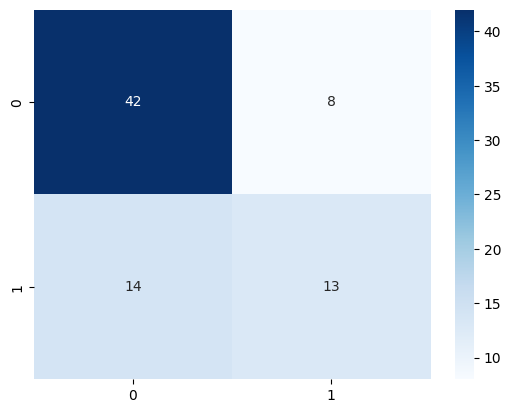

In [26]:
#using random forest
from sklearn.ensemble import RandomForestClassifier
clf_RF = RandomForestClassifier(n_estimators=10)
clf_RF = clf_RF.fit(X_train, y_train)

y_val_RF_pred = clf_RF.predict(X_val)
RF_acc = accuracy_score(y_val,y_val_RF_pred)
RF_confmat = confusion_matrix(y_val, y_val_RF_pred)

print('Accuracy of Random Forest:', RF_acc)
sns.heatmap(RF_confmat,annot=True,cmap='Blues')
plt.show()

Accuracy of Gradient Boosted Trees: 0.7272727272727273


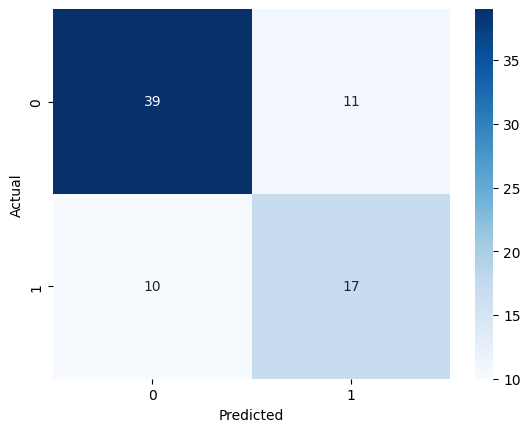

In [27]:
#using gradient boosted trees
from sklearn.ensemble import GradientBoostingClassifier
clf_GBDT = GradientBoostingClassifier(min_samples_leaf=1)
clf_GBDT = clf_GBDT.fit(X_train, y_train)

y_val_GBDT_pred = clf_GBDT.predict(X_val)
GBDT_acc = accuracy_score(y_val,y_val_GBDT_pred)
GBDT_confmat = confusion_matrix(y_val, y_val_GBDT_pred)

print('Accuracy of Gradient Boosted Trees:', GBDT_acc)
sns.heatmap(GBDT_confmat,annot=True,cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

### Exercise

There is a faster version of the gradient boosting approach named [Historgram-based Gradient Boosting Classification Tree](https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.HistGradientBoostingClassifier.html#sklearn.ensemble.HistGradientBoostingClassifier) (`HistGradientBoostingClassifier`).

Implement and compare the performances.

Accuracy of Histogram Gradient Boosted Trees: 0.7532467532467533


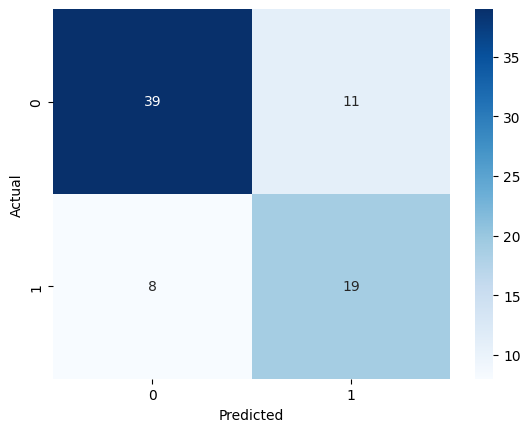

In [28]:
#Enter your code here

from sklearn.ensemble import HistGradientBoostingClassifier
clf_hist = HistGradientBoostingClassifier(min_samples_leaf=1)
clf_hist = clf_hist.fit(X_train, y_train)

y_val_hist_pred = clf_hist.predict(X_val)
hist_acc = accuracy_score(y_val,y_val_hist_pred)
hist_acc_confmat = confusion_matrix(y_val, y_val_hist_pred)

print('Accuracy of Histogram Gradient Boosted Trees:', hist_acc)
sns.heatmap(hist_acc_confmat,annot=True,cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()


## Bagging Methods

[Bagging methods](https://scikit-learn.org/stable/modules/ensemble.html#bagging) is a class of algorithms which build several versions of a black-box prediction model on random subsets of the original training set and then aggregate their individual predictions to form a final prediction.
In scikit-learn, bagging methods are implemented as a unified `BaggingClassifier` meta-estimator. Users can specify the estimator/model along with parameters specifying the strategy to draw random subsets.

In the following example, let's try the bagging method with a Logistic Regression model:

Accuracy of Gradient Boosted Trees: 0.7792207792207793


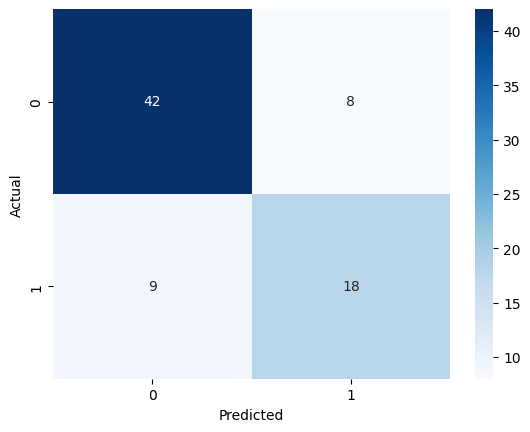

In [29]:
from sklearn.ensemble import BaggingClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression

#normalize the training data
scaler = StandardScaler().fit(X_train)
X_train_norm = scaler.transform(X_train)

#initialize and train classifier
clf_bagging = BaggingClassifier(LogisticRegression(), max_samples=0.5, max_features=0.5)
clf_bagging = clf_bagging.fit(X_train_norm, y_train)

#normalize validation data
X_val_norm = scaler.transform(X_val)

y_val_bagging_pred = clf_bagging.predict(X_val_norm)
bagging_acc = accuracy_score(y_val,y_val_bagging_pred)
bagging_confmat = confusion_matrix(y_val, y_val_bagging_pred)

print('Accuracy of Gradient Boosted Trees:', bagging_acc)
sns.heatmap(bagging_confmat,annot=True,cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

### Voting Classifier

Simple ensemble methods that obnly takes in the majority vote of different classifiers can be implemented using the `VotingClassifier` method (without the bagging of the training dataset).

So let's try to ensemble the Logistic Regression model with Naive Bayes and KNN classifiers:


Accuracy of Gradient Boosted Trees: 0.7532467532467533


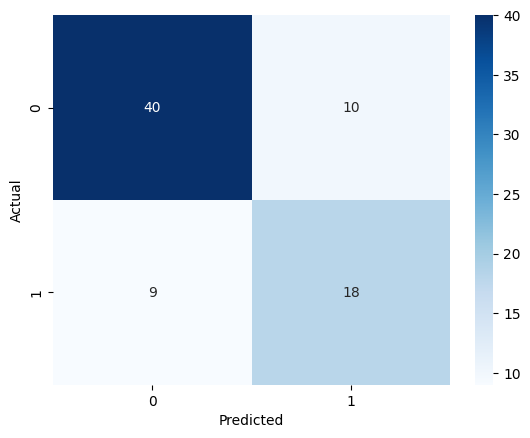

In [30]:
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import VotingClassifier

#initialize the models
clf1 = LogisticRegression(random_state=1)
clf2 = GaussianNB()
clf3 = KNeighborsClassifier(n_neighbors=5)

#ensemble
eclf = VotingClassifier(estimators=[('lr', clf1), ('nb', clf2), ('knn', clf3)],voting='hard')
eclf = eclf.fit(X_train_norm,y_train)

y_val_voting_pred = eclf.predict(X_val_norm)
voting_acc = accuracy_score(y_val,y_val_voting_pred)
voting_confmat = confusion_matrix(y_val, y_val_voting_pred)

print('Accuracy of Gradient Boosted Trees:', voting_acc)
sns.heatmap(voting_confmat,annot=True,cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()



---

## Adaboost

[Adaboost](https://scikit-learn.org/stable/modules/ensemble.html#adaboost) is one of the most popular ensemble approach that is still widely used today. This approach trains a sequence of weak learners (i.e., models that are only slightly better than random guessing, such as small decision trees) on repeatedly modified versions of the data (weighted data). The predictions from all of them are then combined through a weighted majority vote (or sum) to produce the final prediction.

Similar to previous models, Adaboost can be easily implemented via scikit-learn.

Accuracy of Gradient Boosted Trees: 0.7532467532467533


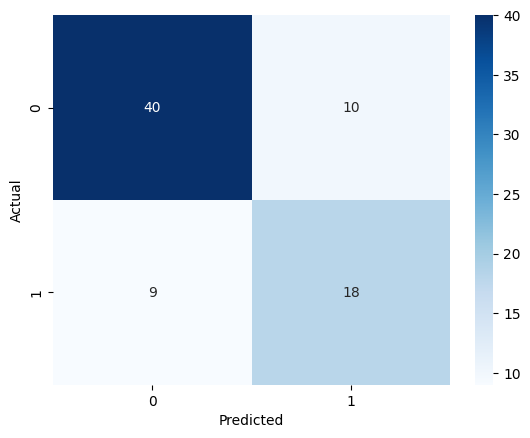

In [31]:
from sklearn.ensemble import AdaBoostClassifier

#initialize adaboost classifier (by default, based classifier is a DT)
clf_AB = AdaBoostClassifier(n_estimators=100) #train 100 weak learners
clf_AB = clf_AB.fit(X_train_norm,y_train)

y_val_ab_pred = clf_AB.predict(X_val_norm)
ab_acc = accuracy_score(y_val,y_val_ab_pred)
ab_confmat = confusion_matrix(y_val, y_val_ab_pred)

print('Accuracy of Gradient Boosted Trees:', ab_acc)
sns.heatmap(ab_confmat,annot=True,cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()


The default base estimator for the Adaboost implementation is a DT. For other types of based estimators, just initialize and set the `estimator` parameter. For instance, the following code uses the `LogisticRegression` (previously already initialized as clf1) as the base estimator.

Accuracy of Gradient Boosted Trees: 0.7792207792207793


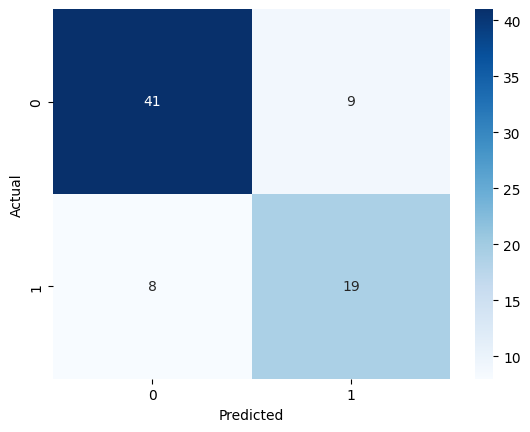

In [32]:
#initialize adaboost classifier using LogisticRegression as the base estimator
clf_AB_other = AdaBoostClassifier(estimator =clf1, n_estimators=100) #train 100 weak learners
clf_AB_other = clf_AB_other.fit(X_train_norm,y_train)

y_val_abo_pred = clf_AB_other.predict(X_val_norm)
abo_acc = accuracy_score(y_val,y_val_abo_pred)
abo_confmat = confusion_matrix(y_val, y_val_abo_pred)

print('Accuracy of Gradient Boosted Trees:', abo_acc)
sns.heatmap(abo_confmat,annot=True,cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()


## Exercise

Now that there are multiple types of models trained and validated, using the respective training and validation sets, evaluate the best model from each category on the test set to compare and find the overall best performing model. Is it the same as the best performing model on the validation set?

C:\Users\user\AppData\Roaming\Python\Python311\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy of Gradient Boosted Trees: 0.7792207792207793


C:\Users\user\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but AdaBoostClassifier was fitted with feature names
  warnings.warn(


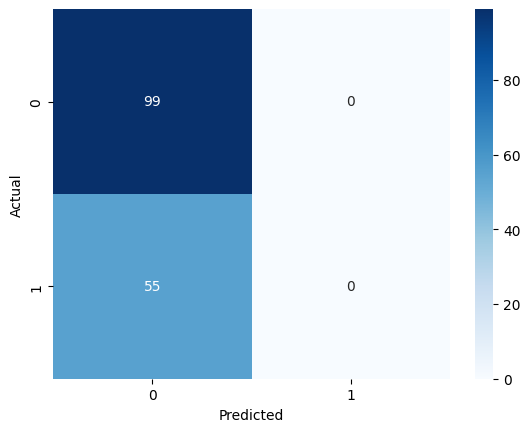

In [33]:
# AdaBoost with test set

caler_test = StandardScaler().fit(X_test)
#normalize validation data
X_test_norm = scaler.transform(X_test)

#Enter your code here
clf_AB_new = AdaBoostClassifier(estimator =clf1, n_estimators=100) #train 100 weak learners
clf_AB_new = clf_AB_new.fit(X_train,y_train)

y_val_abo_pred_new = clf_AB_new.predict(X_test_norm)
abo_acc_new = accuracy_score(y_test,y_val_abo_pred_new)
abo_confmat_new = confusion_matrix(y_test, y_val_abo_pred_new)

print('Accuracy of Gradient Boosted Trees:', abo_acc)
sns.heatmap(abo_confmat_new,annot=True,cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

